# Loading the Breast Cancer Wisconsin dataset


In [1]:
import pandas
import numpy
import sys
%matplotlib inline
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix
import seaborn as sns
import numpy as np
import time
from sklearn import metrics, grid_search, cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
from sklearn.svm import SVC
# fix random seed for reproducibility
plt.rcParams['figure.figsize'] = (15, 6)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [2]:
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data"
dataset = pandas.read_csv('wdbc.data.txt', header=None)
data = pandas.read_csv('wdbc.data.txt', header=None)
peek = data.head(5)
print(peek)

         0  1      2      3       4       5        6        7       8   \
0    842302  M  17.99  10.38  122.80  1001.0  0.11840  0.27760  0.3001   
1    842517  M  20.57  17.77  132.90  1326.0  0.08474  0.07864  0.0869   
2  84300903  M  19.69  21.25  130.00  1203.0  0.10960  0.15990  0.1974   
3  84348301  M  11.42  20.38   77.58   386.1  0.14250  0.28390  0.2414   
4  84358402  M  20.29  14.34  135.10  1297.0  0.10030  0.13280  0.1980   

        9    ...        22     23      24      25      26      27      28  \
0  0.14710   ...     25.38  17.33  184.60  2019.0  0.1622  0.6656  0.7119   
1  0.07017   ...     24.99  23.41  158.80  1956.0  0.1238  0.1866  0.2416   
2  0.12790   ...     23.57  25.53  152.50  1709.0  0.1444  0.4245  0.4504   
3  0.10520   ...     14.91  26.50   98.87   567.7  0.2098  0.8663  0.6869   
4  0.10430   ...     22.54  16.67  152.20  1575.0  0.1374  0.2050  0.4000   

       29      30       31  
0  0.2654  0.4601  0.11890  
1  0.1860  0.2750  0.08902  
2  0.

In [3]:
shape = data.shape
print(shape)

(569, 32)


In [4]:
types = data.dtypes
print(types)

0       int64
1      object
2     float64
3     float64
4     float64
5     float64
6     float64
7     float64
8     float64
9     float64
10    float64
11    float64
12    float64
13    float64
14    float64
15    float64
16    float64
17    float64
18    float64
19    float64
20    float64
21    float64
22    float64
23    float64
24    float64
25    float64
26    float64
27    float64
28    float64
29    float64
30    float64
31    float64
dtype: object


In [5]:
pandas.set_option('display.width', 100)
pandas.set_option('precision', 3)
description = data.describe()
print(description)

              0        2        3        4         5        6        7        8        9   \
count  5.690e+02  569.000  569.000  569.000   569.000  569.000  569.000  569.000  569.000   
mean   3.037e+07   14.127   19.290   91.969   654.889    0.096    0.104    0.089    0.049   
std    1.250e+08    3.524    4.301   24.299   351.914    0.014    0.053    0.080    0.039   
min    8.670e+03    6.981    9.710   43.790   143.500    0.053    0.019    0.000    0.000   
25%    8.692e+05   11.700   16.170   75.170   420.300    0.086    0.065    0.030    0.020   
50%    9.060e+05   13.370   18.840   86.240   551.100    0.096    0.093    0.062    0.034   
75%    8.813e+06   15.780   21.800  104.100   782.700    0.105    0.130    0.131    0.074   
max    9.113e+08   28.110   39.280  188.500  2501.000    0.163    0.345    0.427    0.201   

            10   ...          22       23       24        25       26       27       28       29  \
count  569.000   ...     569.000  569.000  569.000   569.000  

In [6]:
class_counts = data.groupby(1).size() # 1 is the class atribute in the dataset
print(class_counts)

1
B    357
M    212
dtype: int64


In [7]:
correlations = data.corr(method='pearson')
print(correlations)

           0      2      3      4      5      6          7      8      9      10  ...       22  \
0   1.000e+00  0.075  0.100  0.073  0.097 -0.013  9.570e-05  0.050  0.044 -0.022  ...    0.082   
2   7.463e-02  1.000  0.324  0.998  0.987  0.171  5.061e-01  0.677  0.823  0.148  ...    0.970   
3   9.977e-02  0.324  1.000  0.330  0.321 -0.023  2.367e-01  0.302  0.293  0.071  ...    0.353   
4   7.316e-02  0.998  0.330  1.000  0.987  0.207  5.569e-01  0.716  0.851  0.183  ...    0.969   
5   9.689e-02  0.987  0.321  0.987  1.000  0.177  4.985e-01  0.686  0.823  0.151  ...    0.963   
6  -1.297e-02  0.171 -0.023  0.207  0.177  1.000  6.591e-01  0.522  0.554  0.558  ...    0.213   
7   9.570e-05  0.506  0.237  0.557  0.499  0.659  1.000e+00  0.883  0.831  0.603  ...    0.535   
8   5.008e-02  0.677  0.302  0.716  0.686  0.522  8.831e-01  1.000  0.921  0.501  ...    0.688   
9   4.416e-02  0.823  0.293  0.851  0.823  0.554  8.311e-01  0.921  1.000  0.462  ...    0.830   
10 -2.211e-02  0.148

In [8]:
skew = data.skew()
print(skew)

0     6.474
2     0.942
3     0.650
4     0.991
5     1.646
6     0.456
7     1.190
8     1.401
9     1.171
10    0.726
11    1.304
12    3.089
13    1.646
14    3.444
15    5.447
16    2.314
17    1.902
18    5.110
19    1.445
20    2.195
21    3.924
22    1.103
23    0.498
24    1.128
25    1.859
26    0.415
27    1.474
28    1.150
29    0.493
30    1.434
31    1.663
dtype: float64


# Visulize the data

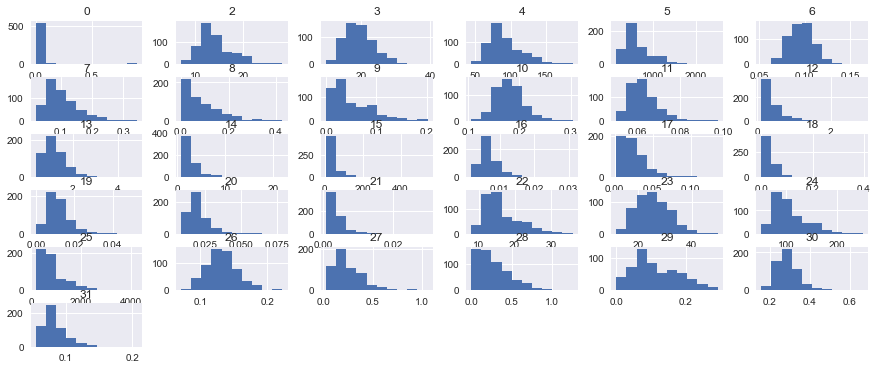

In [9]:
data.hist()
plt.show()

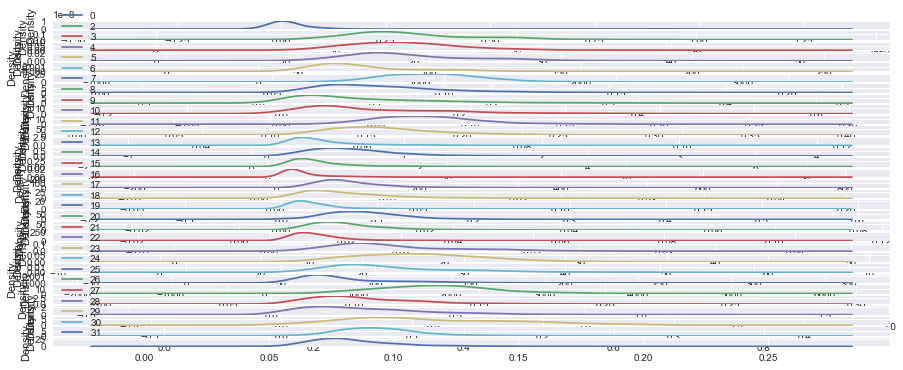

In [10]:
data.plot(kind='density', subplots=True,  sharex=False)
plt.rcParams['figure.figsize'] = (20, 60)
plt.show()

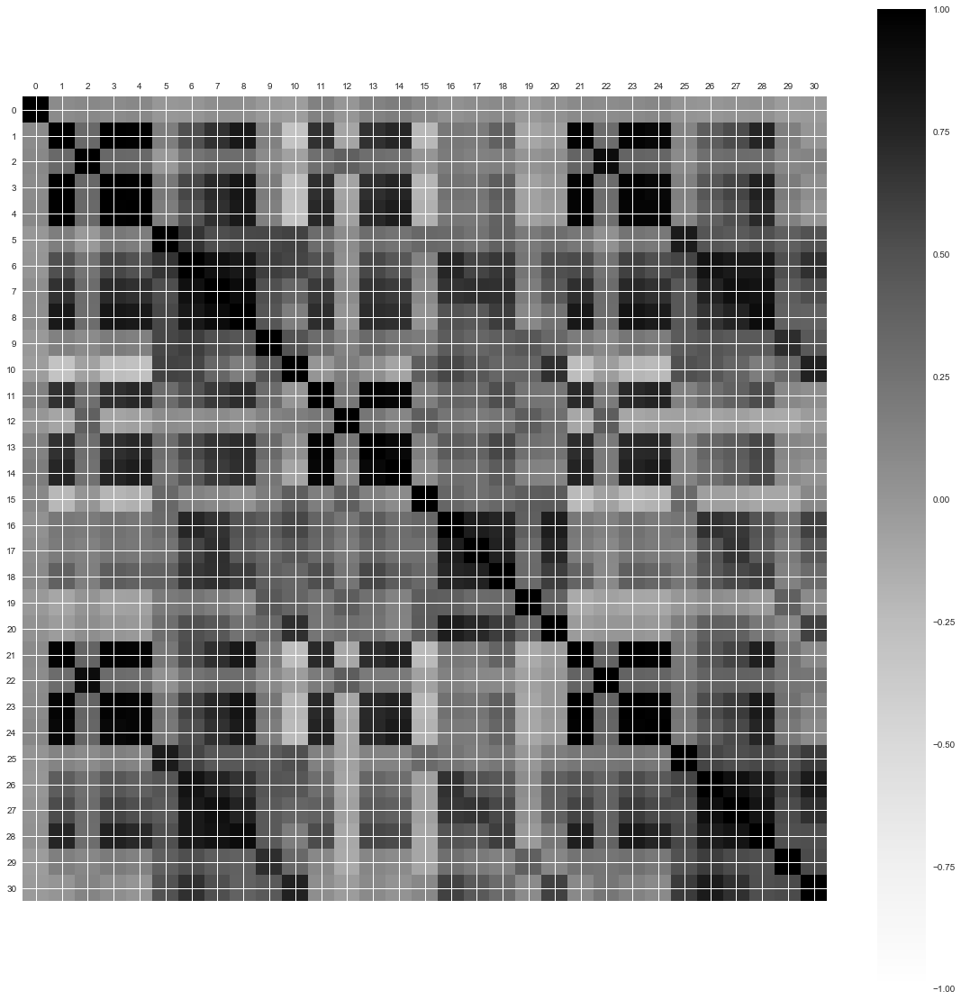

In [11]:
plt.rcParams['figure.figsize'] = (20, 20)
correlations = data.corr()
# plot correlation matrix
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,31,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
plt.show()

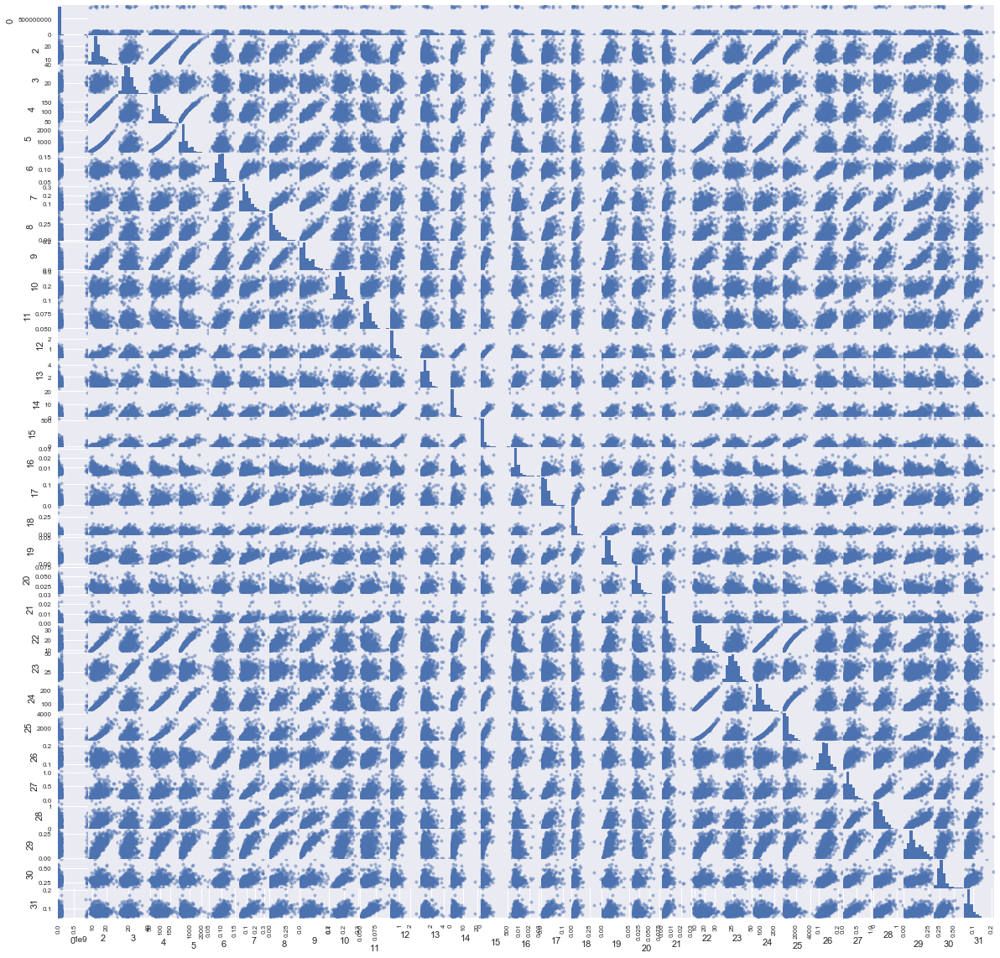

In [12]:
scatter_matrix(data)
plt.show()

# Prepare the data for classification

In [13]:
from sklearn.preprocessing import LabelEncoder
X = data.loc[:, 2:].values
y = data.loc[:, 1].values
le = LabelEncoder()
y = le.fit_transform(y)
le.transform(['M', 'B'])

array([1, 0])

In [14]:
from sklearn.cross_validation import train_test_split
# Extracting 20% testing data
X_train_feature, X_deploy, y_train_feature, y_deploy = train_test_split(
    X, y, test_size=0.20, random_state=17)
# Make training and validation data sets for building the models and choose the hyperparameters
X_train, X_test, y_train, y_test = train_test_split(
    X_train_feature, y_train_feature, test_size=0.20, random_state=17)
print('Number of training examples',len(X_train))
print('Number of validation examples',len(X_test))
print('Number of testing examples',len(X_deploy))


Number of training examples 364
Number of validation examples 91
Number of testing examples 114


## Preproccing

In [15]:
from sklearn import preprocessing
# normalize the data attributes
X_train = preprocessing.normalize(X_train)
X_test = preprocessing.normalize(X_test)
X_deploy = preprocessing.normalize(X_deploy)
# standardize the data attributes
X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)
X_deploy = preprocessing.scale(X_deploy)

# Feature Selection

In [16]:
from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X_train, y_train)
# display the relative importance of each attribute
print(model.feature_importances_)

[ 0.10924291  0.03386346  0.0791842   0.09775197  0.02160012  0.01065173
  0.0255599   0.03867821  0.06053787  0.03711885  0.00372097  0.0040746
  0.00508542  0.0078894   0.03802533  0.00275257  0.00957544  0.01093176
  0.04388968  0.01366021  0.08722749  0.01057905  0.04080505  0.06436129
  0.04929535  0.0098644   0.00825664  0.0247432   0.03780641  0.01326652]


In [17]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
# create the RFE model and select 5 attributes
rfe = RFE(model, 5)
rfe = rfe.fit(X_train, y_train)
# summarize the selection of the attributes
print(rfe.support_)
print(rfe.ranking_)

[ True False  True False False False False  True False False False False
 False False False False False False False False  True  True False False
 False False False False False False]
[ 1 10  1  2 13 18 11  1 22  7 19 23 21  6 16  5 17 20 26  9  1  1  3 15 25
  4  8 14 12 24]


# Building classifiers

## KNN classifier
It turns out that k=5 is the best choose of k on the validation set

The time for training KNN is  0.0007388591766357422 seconds 

             precision    recall  f1-score   support

          M       0.93      1.00      0.96        55
          B       1.00      0.89      0.94        36

avg / total       0.96      0.96      0.96        91

The accuracy on validation dataset of KNN: 	 0.956043956044
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.888888888889
F1 score on validation dataset of KNN:     	 0.941176470588


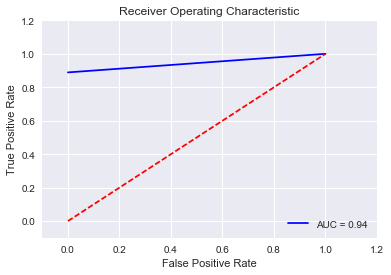

In [18]:
from sklearn.neighbors import KNeighborsClassifier
clf_neigh = KNeighborsClassifier(n_neighbors=5)
plt.rcParams['figure.figsize'] = (6, 4)
#Training
start_time = time.time()
clf_neigh.fit(X_train, y_train)
print("The time for training KNN is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_neigh.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## SVM classifier
### Linear SVM "LinearSVC"
It turns out that C=20 is the best on the validation set

The time for training SVM is  0.002853870391845703 seconds 

             precision    recall  f1-score   support

          M       0.98      0.96      0.97        55
          B       0.95      0.97      0.96        36

avg / total       0.97      0.97      0.97        91

The accuracy on validation dataset of KNN: 	 0.967032967033
Precision on validation dataset of KNN:    	 0.945945945946
Recall on validation dataset of KNN :      	 0.972222222222
F1 score on validation dataset of KNN:     	 0.958904109589


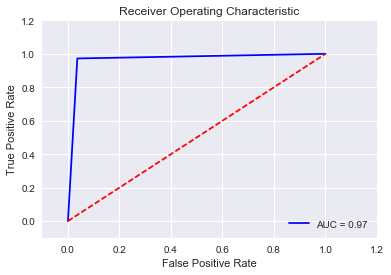

In [19]:
from sklearn.svm import LinearSVC
clf_svm_linear = LinearSVC(C=20.0)
#Training
start_time = time.time()
clf_svm_linear.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm_linear.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

###  SVM "SVC" with kernel='rbf' 


The time for training SVM is  0.004086971282958984 seconds 

             precision    recall  f1-score   support

          M       0.95      0.98      0.96        55
          B       0.97      0.92      0.94        36

avg / total       0.96      0.96      0.96        91

The accuracy on validation dataset of KNN: 	 0.956043956044
Precision on validation dataset of KNN:    	 0.970588235294
Recall on validation dataset of KNN :      	 0.916666666667
F1 score on validation dataset of KNN:     	 0.942857142857


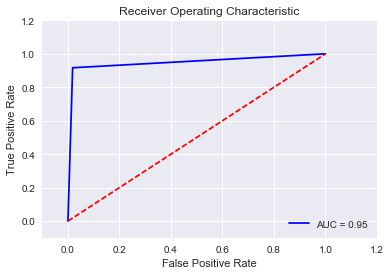

In [20]:
from sklearn.svm import SVC
clf_svm = SVC(kernel='rbf')
#Training
start_time = time.time()
clf_svm.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Decsion Tree classifier
### DT with Gini impurity "gini", CART (Classification and Regression Trees)
It turns out that min_samples_split=2 is the best on the validation set

The time for training Decision Tree is  0.003883838653564453 seconds 

             precision    recall  f1-score   support

          M       0.95      0.95      0.95        55
          B       0.92      0.92      0.92        36

avg / total       0.93      0.93      0.93        91

The accuracy on validation dataset of KNN: 	 0.934065934066
Precision on validation dataset of KNN:    	 0.916666666667
Recall on validation dataset of KNN :      	 0.916666666667
F1 score on validation dataset of KNN:     	 0.916666666667


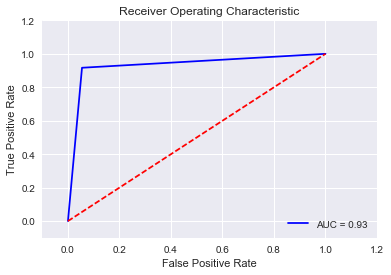

In [21]:
# CART tree
from sklearn.tree import DecisionTreeClassifier
clf_dt = DecisionTreeClassifier(min_samples_split=2)
#Training
start_time = time.time()
clf_dt.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### DT with “entropy” for the information gain, C4.5 (aka J48 is an open source Java Weka) and C5.0
It turns out that min_samples_split=2 is the best on the validation set

The time for training Decision Tree is  0.004964113235473633 seconds 

             precision    recall  f1-score   support

          M       0.90      1.00      0.95        55
          B       1.00      0.83      0.91        36

avg / total       0.94      0.93      0.93        91

The accuracy on validation dataset of KNN: 	 0.934065934066
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.833333333333
F1 score on validation dataset of KNN:     	 0.909090909091


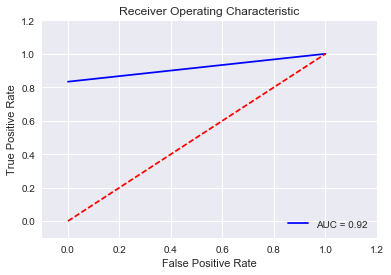

In [22]:
# Here I use C5.0 tree as its more accurate that C4.5 and more recent.
from sklearn.tree import DecisionTreeClassifier
clf_dt_IG = DecisionTreeClassifier(criterion='entropy', min_samples_split=2)
#Training
start_time = time.time()
clf_dt_IG.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_IG.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

 Ensemble methods

## Bagging Method


### Bagging Method with Knn


Using Best KNN classifier fitted the data, each built on random subsets of 50% of the samples and 50% of the features.

The time for training Bagging Knn is  0.00956416130065918 seconds 

             precision    recall  f1-score   support

          M       0.92      1.00      0.96        55
          B       1.00      0.86      0.93        36

avg / total       0.95      0.95      0.94        91

The accuracy on validation dataset of KNN: 	 0.945054945055
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.861111111111
F1 score on validation dataset of KNN:     	 0.925373134328


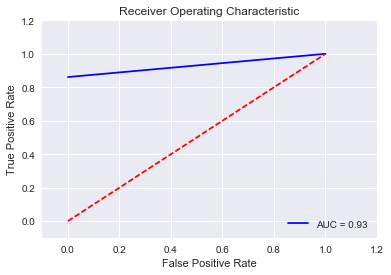

In [23]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
clf_dt_BGKN = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGKN.fit(X_train, y_train)
print("The time for training Bagging Knn is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGKN.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### Bagging Method with DT


Using Best DT with 'entropy', each built on random subsets of 50% of the samples and 50% of the features.

The time for training Bagging DT is  0.017876863479614258 seconds 

             precision    recall  f1-score   support

          M       0.92      0.98      0.95        55
          B       0.97      0.86      0.91        36

avg / total       0.94      0.93      0.93        91

The accuracy on validation dataset of KNN: 	 0.934065934066
Precision on validation dataset of KNN:    	 0.96875
Recall on validation dataset of KNN :      	 0.861111111111
F1 score on validation dataset of KNN:     	 0.911764705882


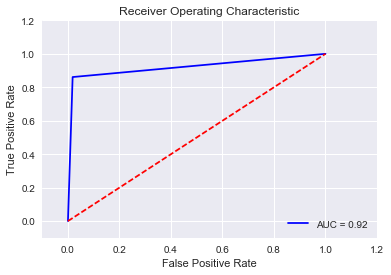

In [24]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
clf_dt_BGDT = BaggingClassifier(DecisionTreeClassifier(criterion='entropy', min_samples_split=2),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGDT.fit(X_train, y_train)
print("The time for training Bagging DT is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGDT.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Random Forest
DT with 'gini'

The time for training Decision Tree is  0.015162229537963867 seconds 

             precision    recall  f1-score   support

          M       0.95      0.98      0.96        55
          B       0.97      0.92      0.94        36

avg / total       0.96      0.96      0.96        91

The accuracy on validation dataset of KNN: 	 0.956043956044
Precision on validation dataset of KNN:    	 0.970588235294
Recall on validation dataset of KNN :      	 0.916666666667
F1 score on validation dataset of KNN:     	 0.942857142857


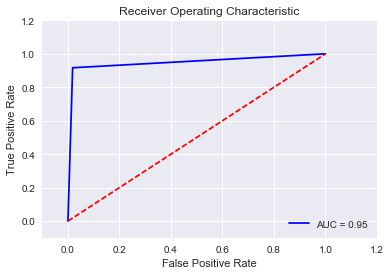

In [25]:
from sklearn.ensemble import RandomForestClassifier
clf_dt_RF = RandomForestClassifier()
#Training
start_time = time.time()
clf_dt_RF.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_RF.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### Ada Boost
DT with 'gini'

The time for training Decision Tree is  0.10085606575012207 seconds 

             precision    recall  f1-score   support

          M       0.98      1.00      0.99        55
          B       1.00      0.97      0.99        36

avg / total       0.99      0.99      0.99        91

The accuracy on validation dataset of KNN: 	 0.989010989011
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.972222222222
F1 score on validation dataset of KNN:     	 0.985915492958


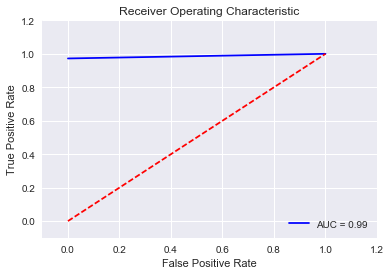

In [26]:
from sklearn.ensemble import AdaBoostClassifier
clf_dt_AD = AdaBoostClassifier()
#Training
start_time = time.time()
clf_dt_AD.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_AD.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Naive Bayes methods

The time for training Naive Bayes is  0.0013980865478515625 seconds 

             precision    recall  f1-score   support

          M       0.98      0.76      0.86        55
          B       0.73      0.97      0.83        36

avg / total       0.88      0.85      0.85        91

The accuracy on validation dataset of KNN: 	 0.846153846154
Precision on validation dataset of KNN:    	 0.729166666667
Recall on validation dataset of KNN :      	 0.972222222222
F1 score on validation dataset of KNN:     	 0.833333333333


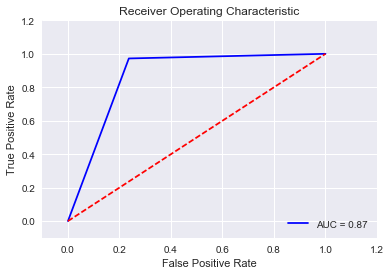

In [27]:
from sklearn.naive_bayes import GaussianNB
clf_NB = GaussianNB()
#Training
start_time = time.time()
clf_NB.fit(X_train, y_train)
print("The time for training Naive Bayes is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_NB.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Linear Discriminant Analysis classifier

The time for training Decision Tree is  0.002421140670776367 seconds 

             precision    recall  f1-score   support

          M       0.92      0.98      0.95        55
          B       0.97      0.86      0.91        36

avg / total       0.94      0.93      0.93        91

The accuracy on validation dataset of KNN: 	 0.934065934066
Precision on validation dataset of KNN:    	 0.96875
Recall on validation dataset of KNN :      	 0.861111111111
F1 score on validation dataset of KNN:     	 0.911764705882


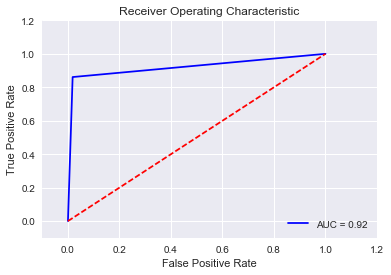

In [28]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
clf_dt_LDA = LinearDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_LDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_LDA.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Quadratic Discriminant Analysis classifier

The time for training Decision Tree is  0.002344846725463867 seconds 

             precision    recall  f1-score   support

          M       0.91      0.89      0.90        55
          B       0.84      0.86      0.85        36

avg / total       0.88      0.88      0.88        91

The accuracy on validation dataset of KNN: 	 0.879120879121
Precision on validation dataset of KNN:    	 0.837837837838
Recall on validation dataset of KNN :      	 0.861111111111
F1 score on validation dataset of KNN:     	 0.849315068493


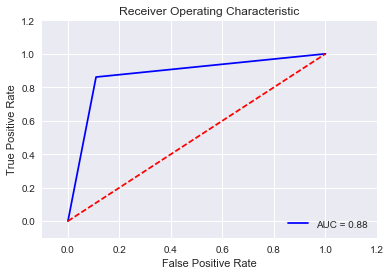

In [29]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
clf_dt_QDA = QuadraticDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_QDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_QDA.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Logistic Regression

The time for training LDA is  0.0035610198974609375 seconds 

             precision    recall  f1-score   support

          M       0.98      0.98      0.98        55
          B       0.97      0.97      0.97        36

avg / total       0.98      0.98      0.98        91

The accuracy on validation dataset of KNN: 	 0.978021978022
Precision on validation dataset of KNN:    	 0.972222222222
Recall on validation dataset of KNN :      	 0.972222222222
F1 score on validation dataset of KNN:     	 0.972222222222


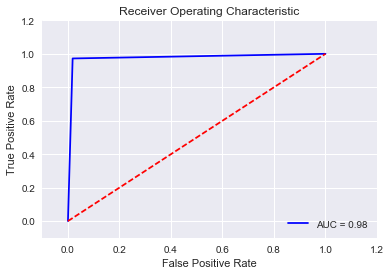

In [30]:
from sklearn.linear_model import LogisticRegression
LogReg = LogisticRegression(C=1e5)
#Training
start_time = time.time()
LogReg.fit(X_train, y_train)
print("The time for training LDA is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = LogReg.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Gaussian Process Classifier

The time for training QDA is  0.04738116264343262 seconds 

             precision    recall  f1-score   support

          M       0.93      1.00      0.96        55
          B       1.00      0.89      0.94        36

avg / total       0.96      0.96      0.96        91

The accuracy on validation dataset of KNN: 	 0.956043956044
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.888888888889
F1 score on validation dataset of KNN:     	 0.941176470588


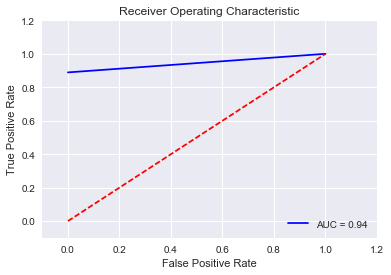

In [31]:
from sklearn.gaussian_process import GaussianProcessClassifier
GP = GaussianProcessClassifier()
#Training
start_time = time.time()
GP.fit(X_train, y_train)
print("The time for training QDA is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = GP.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## LightGBM, Light Gradient Boosting Machine


             precision    recall  f1-score   support

          M       0.90      0.98      0.94        55
          B       0.97      0.83      0.90        36

avg / total       0.93      0.92      0.92        91

The accuracy on validation dataset of KNN: 	 0.923076923077
Precision on validation dataset of KNN:    	 0.967741935484
Recall on validation dataset of KNN :      	 0.833333333333
F1 score on validation dataset of KNN:     	 0.89552238806


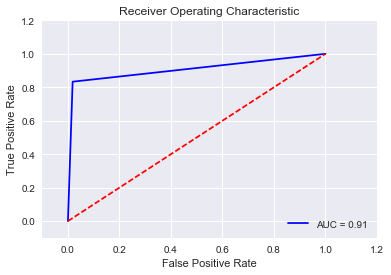

In [32]:
import lightgbm as lgb
lgb_train = lgb.Dataset(X_train, y_train)
gbm = lgb.LGBMClassifier()
gbm.fit(X_train, y_train)
y_pred = gbm.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## XGBoost, eXtreme Gradient Boosting


             precision    recall  f1-score   support

          M       0.95      1.00      0.97        55
          B       1.00      0.92      0.96        36

avg / total       0.97      0.97      0.97        91

The accuracy on validation dataset of KNN: 	 0.967032967033
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.916666666667
F1 score on validation dataset of KNN:     	 0.95652173913


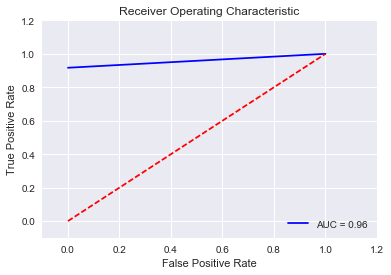

In [33]:
import xgboost as xgb
XG_Boost = xgb.XGBClassifier(max_depth=3, n_estimators=300, learning_rate=0.05).fit(X_train, y_train)
y_pred = XG_Boost.predict(X_test)

print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Neural Networks

In [34]:
import seaborn as sns
import numpy as np
from sklearn.cross_validation import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.regularizers import l2

from keras.utils import np_utils

labelsTrain = np_utils.to_categorical(y_train)
labelsTest = np_utils.to_categorical(y_test)                                              
model = Sequential()
model.add(Dense(30,
                input_shape=(30,), 
                activation="relu",
                W_regularizer=l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(2, activation="softmax"))

model.compile(loss='categorical_crossentropy',
              metrics=['accuracy'],
              optimizer='adam')
# Actual modelling
start_time = time.time()
model.fit(X_train, labelsTrain, verbose=0, batch_size=30, nb_epoch=100)
print("The time for training NN is  %s seconds " % (time.time() - start_time))
score, accuracy = model.evaluate(X_test, labelsTest, batch_size=30, verbose=0)
print("Test fraction correct (NN-Score) = {:.2f}".format(score))
print("Test fraction correct (NN-Accuracy) = {:.2f}".format(accuracy))

Using Theano backend.


The time for training NN is  1.4562280178070068 seconds 
Test fraction correct (NN-Score) = 0.09
Test fraction correct (NN-Accuracy) = 0.97



             precision    recall  f1-score   support

          M       0.95      1.00      0.97        55
          B       1.00      0.92      0.96        36

avg / total       0.97      0.97      0.97        91

The accuracy on validation dataset of KNN: 	 0.967032967033
Precision on validation dataset of KNN:    	 1.0
Recall on validation dataset of KNN :      	 0.916666666667
F1 score on validation dataset of KNN:     	 0.95652173913


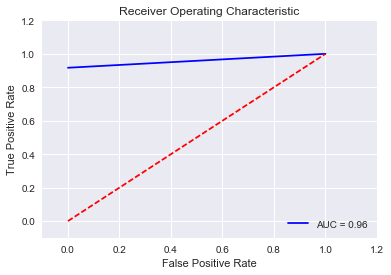

In [35]:
print("\n===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['M', 'B']))

print("===================================================================")
print("The accuracy on validation dataset of KNN: \t", metrics.accuracy_score(y_test, y_pred))
print("Precision on validation dataset of KNN:    \t", metrics.precision_score(y_test, y_pred))
print("Recall on validation dataset of KNN :      \t", metrics.recall_score(y_test, y_pred))
print("F1 score on validation dataset of KNN:     \t", metrics.f1_score(y_test, y_pred))
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate, 'b',
label='AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.2])
plt.ylim([-0.1,1.2])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [36]:
path = './cancer/'
sys.path.append("./cancer")
model.save_weights('CancerModelbest.hdf5',overwrite=True)

In [37]:
np.save('./cancer/X_train', X_train)
np.save('./cancer/y_train', y_train)
np.save('./cancer/X_test', X_test)
np.save('./cancer/y_test', y_test)
np.save('./cancer/X_deploy', X_deploy)
np.save('./cancer/y_deploy', y_deploy)